In [1]:
import numpy as np
from scipy import interpolate
from scipy import stats
import sys
import os
import config

from matplotlib.colors import LogNorm


from cibmockgen import *
from mock_lens_test import *
from bias_modl import *
from kappa_plotting_fns import *

parent_dir = os.path.abspath(os.path.join(os.getcwd(), ".."))
# Add the parent directory to sys.path
sys.path.append(parent_dir)
from ciber.mocks.lognormal import *
from ciber.mocks.cib_mocks import *

from ciber.plotting.plotting_fns import *

from ciber.core.powerspec_pipeline import *
from ciber.core.ps_pipeline_go import *

from ciber.theory.helgason_model import *
from ciber.theory.cl_predictions import *

In [ ]:
res = delta_fn_sources_test(nsim=nsim, lMax=lMax, lMin=1e4, add_noise=add_noise,
                sigma_noise_pix=sigma_noise_pix, psf_pix_fwhm=psf_pix_fwhm,
               N_CIB_PER_PIXEL=0.2, N_G_PER_PIXEL=0.2, alpha=0., plot=True, 
               grab_cib_sim=grab_cib_sim, datestr='111125', apply_mask=apply_mask, 
               pixel_fn_correct=pixel_fn_correct, 
               lensmode=lensmode, mockstr=mockstr,
               use_beam_in_norm=exact_beam, skew_filter_mode='bandpass', 
               s_max=10.0)


In [30]:
clf = ciber_lens_forecast(ell_min=10.)

clf.load_bl(1, 8)



nbar = 1e5

clf.load_clk()
clf.load_clx(clkg_scale=0.5)
# clf.load_clg(1, catname='WISE', addstr='unWISE_neo8')

clf.forecast_nlkappa()

print(clf.nlk_tot)
# dclsq, _ = clf.forecast_kappa_gal_cross(nbar, plot=False)


Lspace = np.logspace(1, 5, 100)




fsky =  0.00048481322570479725
KeysView(NpzFile '/Users/richardfeder/Documents/ciber/data/fluctuation_data/TM1//beam_correction/bl_est_postage_stamps_TM1_081121.npz' with keys: B_ells_post, ifield_list)
Loaded C_L^kg with scale factor 0.50
Extrapolation power law: Cl ∝ ell^-1.544 for ell > 9480
[6.28318537e-10 6.28318537e-10 6.28318537e-10 ... 6.70382504e-09
 6.70402257e-09 6.70422010e-09]


tracer cat has shape  (400000, 4)
tracer cat has shape  (400000, 4)
mags has length 400000
[17.         17.         17.         ... 24.59798995 24.59798995
 24.59798995]


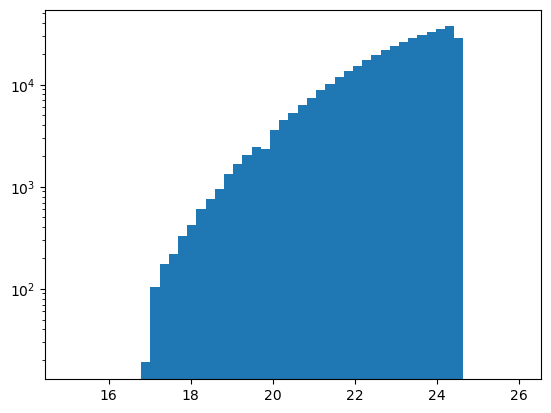

400000
all cib fluxes now has length (399981,)
all cib fluxes now has length (398990,)
all cib fluxes now has length (395404,)
all cib fluxes now has length (385234,)
all cib fluxes now has length (361264,)
all cib fluxes now has length (312515,)
all cib fluxes now has length (227725,)
2.2785570636176824e-09 2.2785570636176824e-09


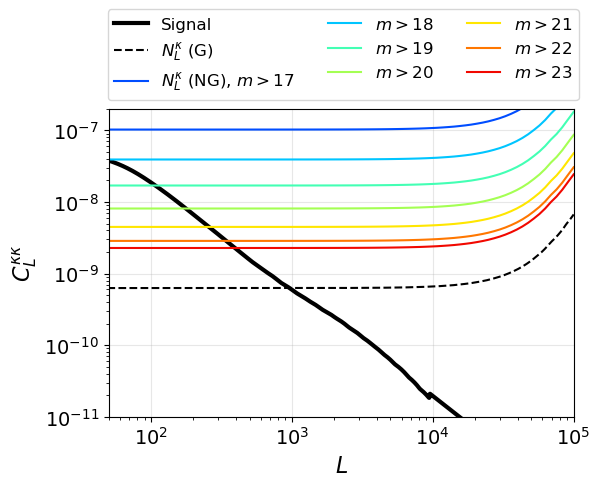

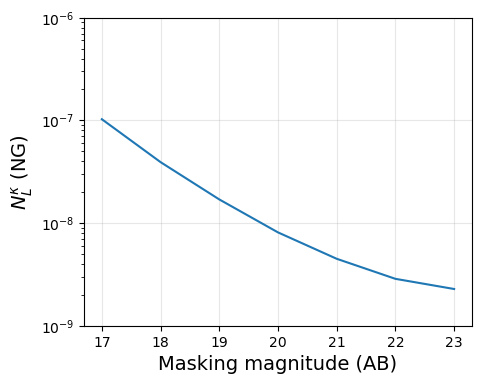

In [55]:
ciber_inst = 1
n_cib_sim = 5
datestr = '111125'

MAP_SIZE = 1024

x = 1

simidx = x % n_cib_sim
tmdir = '../data/lens_prods/mock_dat/'+datestr+'/TM'+str(ciber_inst)

# mockstr='JHlt16_nbar100000.0'

lensmode='unlensed'

Apix=1.15e-9
nbar = 1e5
mockstr = 'noiseless_JHlt16_nbar'+str(nbar)


mock_sim_fpath = tmdir+ '/mock_dat_'+lensmode+'_'+mockstr+'_simidx'+str(simidx)+'.npz'



# This map represents the true sky intensity I(x, y)
cib_intensity_map, all_cib_fluxes, counts_map, mask = generate_cib_map(
                                                    map_size=MAP_SIZE,
                                                    n_cib_per_pixel=0.2, n_gal_per_pixel=0.2,
                                                    seed=None, s_max=None,
                                                mock_sim_fpath=mock_sim_fpath, apply_mask=False)


fieldidx = 0


mock_dat = np.load(mock_sim_fpath, allow_pickle=True)
_, kappa_map, total_signal,\
     counts_map, tracer_cat = [mock_dat[key][fieldidx] for key in ['cib_maps', 'kappa_maps', 'total_signal', 'galdens', 'tracer_cats']]

print('tracer cat has shape ', tracer_cat.shape)
mags = tracer_cat[:,3]

print('mags has length', len(mags))
print(mags)

plt.figure()
plt.hist(mags, bins=np.linspace(15, 26, 50))
plt.yscale('log')
plt.show()

mag_mask = (mags > 20)
mag_mask *= (mags < 24)

print(len(all_cib_fluxes))


# all_cib_fluxes = all_cib_fluxes[mag_mask]

# print('all cib fluxes now has length', all_cib_fluxes)

# N_G_PER_PIXEL = len(all_cib_fluxes)/MAP_SIZE**2
# N_CIB_PER_PIXEL = len(all_cib_fluxes)/MAP_SIZE**2
# galaxy_fluxes = all_cib_fluxes.copy()


mag_mins = np.arange(17.0, 24.0)

trispec_noise_vs_magcut = np.zeros((len(mag_mins)))


for m, mag in enumerate(mag_mins):

    mag_mask = (mags > mag)
    
    mag_mask *= (mags < 25)
    all_cib_fluxes_use = all_cib_fluxes[mag_mask]

    print('all cib fluxes now has length', all_cib_fluxes_use.shape)

    N_G_PER_PIXEL = len(all_cib_fluxes_use)/MAP_SIZE**2
    N_CIB_PER_PIXEL = len(all_cib_fluxes_use)/MAP_SIZE**2
    galaxy_fluxes = all_cib_fluxes_use.copy()


    delta_c, c_i_shot,\
        c_i2_g_shot, galshot, \
            trispec_noise_cib, trispec_noise_g = calculate_analytic_bias(N_CIB_PER_PIXEL, N_G_PER_PIXEL,
                                                                         fluxes_cib=all_cib_fluxes_use,
                                                                        fluxes_g=galaxy_fluxes,
                                                                        pix_area=Apix
                                                                    )
    
    trispec_noise_vs_magcut[m] = trispec_noise_cib

print(trispec_noise_cib, trispec_noise_g)


colors = plt.cm.jet(np.linspace(0.2, 0.9, len(mag_mins)))

plt.figure(figsize=(6, 4))


plt.plot(clf.lrange, 2.*clf.clx, color='k', linestyle='solid', linewidth=3, label='Signal')

plt.plot(clf.lrange, clf.nlk_tot, color='k', linestyle='dashed', label='$N_L^{\\kappa}$ (G)')

for x in range(len(trispec_noise_vs_magcut)):
    if x==0:
        nglab = '$N_L^{\\kappa}$ (NG), $m>'+str(int(mag_mins[x]))+'$'
    else:
        nglab = '$m>'+str(int(mag_mins[x]))+'$'
    plt.plot(Lspace, trispec_noise_vs_magcut[x]/clf.bl(Lspace)**2, color=colors[x], label=nglab)
    

    
# plt.plot(Lspace, clf.bl(Lspace))
plt.xscale('log')
plt.yscale('log')
plt.xlim(50, 1e5)
plt.ylim(1e-11, 2e-7)
plt.legend(fontsize=12,ncol=3, loc=2, bbox_to_anchor=[-0.02, 1.35])
plt.grid(alpha=0.3)

plt.tick_params(labelsize=14)
plt.xlabel('$L$', fontsize=16)
plt.ylabel('$C_L^{\\kappa \\kappa}$', fontsize=16)
plt.savefig('../figures/clkk_compare_gauss_nongauss_noise.pdf', bbox_inches='tight')
plt.show()





plt.figure(figsize=(5, 4))
plt.plot(mag_mins, trispec_noise_vs_magcut)
plt.yscale('log')
plt.xlabel('Masking magnitude (AB)', fontsize=14)
plt.ylabel('$N_{L}^{\\kappa}$ (NG)', fontsize=14)
plt.ylim(1e-9, 1e-6)
plt.grid(alpha=0.3)
plt.show()


# # --- 4. Calculate the Analytic Bias ---
# analytic_bias, c_i_shot, c_i2_g_shot, galshot = calculate_analytic_bias(
#     fluxes_cib=all_cib_fluxes,
#     fluxes_g=galaxy_fluxes,
#     pix_area=Apix
# )



fsky =  0.00048481322570479725
KeysView(NpzFile '/Users/richardfeder/Documents/ciber/data/fluctuation_data/TM1//beam_correction/bl_est_postage_stamps_TM1_081121.npz' with keys: B_ells_post, ifield_list)


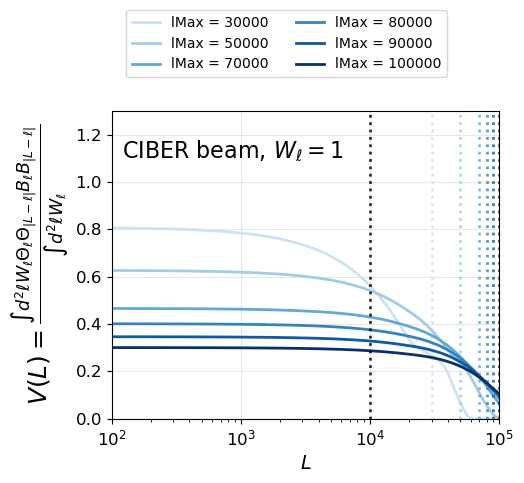

In [2]:
ifield = 8
ciber_inst = 1
lMin = 1e4
lMax = 1e5


clf = ciber_lens_forecast(ell_min=1, ell_max=2.*lMax)
clf.load_bl(ciber_inst, ifield, inplace=True, plot=False)


W_ell_use = lambda ell: clf.bl(ell)/2
ellfine = np.logspace(2, 5, 100)


ylab = '$V(L) = \\frac{\\int d^2 \\ell W_{\\ell} \\Theta_{\\ell}\\Theta_{|L-\\ell|} B_{\\ell}B_{|L-\\ell|}}{\\int d^2\\ell W_{\\ell}}$'

# textstr = '$B_{\\ell}=1$, $W_{\\ell}=1$'
textstr = 'CIBER beam, $W_{\\ell}=1$'

fig = plot_bispectrum_beam_correction_lmax_comparison(clf, lMax_vals=[3e4, 5e4, 7e4, 8e4, 9e4, 1e5],
                                                      FWHM_ARCSEC=None, figsize=(5, 4), lw=2, ylab=ylab, 
                                                     n_grid=1024, textstr=textstr)
# fig.savefig('../figures/bispectrum_BL_correction_flatweights_CIBERbeam_vs_ellmax.png', bbox_inches='tight', dpi=200)

# plt.yscale('log')
# plt.savefig('../figures/bispectrum_BL_correction_flatweights_lMax=1.5e5.png', bbox_inches='tight', dpi=200)



fsky =  0.00048481322570479725
KeysView(NpzFile '/Users/richardfeder/Documents/ciber/data/fluctuation_data/TM1//beam_correction/bl_est_postage_stamps_TM1_081121.npz' with keys: B_ells_post, ifield_list)


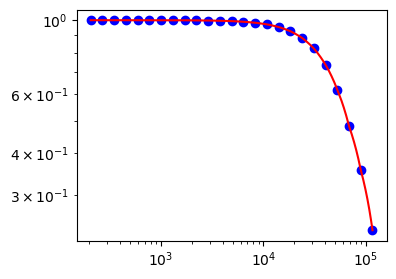

/Users/richardfeder/Documents/ciber/FlatSkyQE/bias_modl.py:224: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  k_correct_num, _ = quad(B_ell_sq, ell_min, ell_max)
/Users/richardfeder/Documents/ciber/FlatSkyQE/bias_modl.py:260: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  k_correct_denom, _ = quad(integrand_denom, ell_min, ell_max)
/Users/richardfeder/Documents/ciber/FlatSkyQE/bias_modl.py:275: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.4012336056641002
[0.99999932 0.99999906 0.9999987  0.99999819 0.99999748 0.9999965
 0.99999514 0.99999325 0.99999062 0.99998697 0.99998189 0.99997484
 0.99996504 0.99995142 0.9999325  0.99990621 0.99986969 0.99981894
 0.99974842 0.99965046 0.99951436 0.99932528 0.99906265 0.99869787
 0.99819129 0.99748797 0.99651179 0.99515748 0.99327967 0.9906782
 0.98707832 0.98210482 0.9752488  0.96582674 0.95293333 0.93539336
 0.91172584 0.88014641 0.83865417 0.78527219 0.7185238  0.63819123
 0.54625688 0.44762422 0.34987242 0.26138566 0.18830318 0.13235167
 0.09143974 0.06209083]


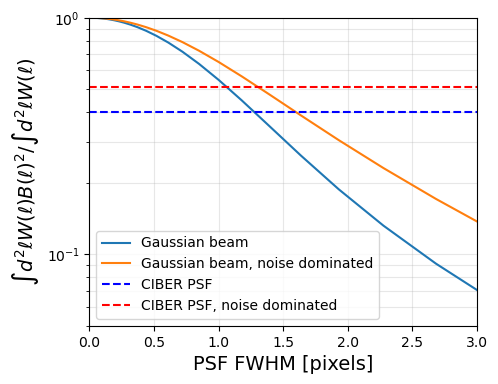

In [2]:
# bias_modl.py
from bias_modl import *

pixsize = 7.

psf_pix_fwhm = 2.0

ciber_inst = 1
ifield = 8

lMin = 10000
lMax = 80000


sigma_b = psf_pix_fwhm_to_sigma_rad(pixsize, psf_pix_fwhm)
clf = ciber_lens_forecast(ell_min=1, ell_max=2.*lMax)


# kscalar = compute_scalar_correction(pixsize, psf_pix_fwhm, ell_min=lMin, ell_max=lMax)

kscalarb = compute_beam_correction(pixsize, psf_pix_fwhm, ell_min=lMin, ell_max=lMax)

clf.load_bl(ciber_inst, ifield, inplace=True, plot=True)
kcorr_num = compute_beam_correction(pixsize, None, ell_min=lMin, ell_max=lMax, 
                               B_ell=clf.bl)


def W_ell(ell):
    return clf.bl(ell)**2


kcorr_num_weighted = compute_beam_correction_num(clf.bl, ell_min=lMin, ell_max=lMax, W_ell=W_ell)


B_ell_gauss = lambda ell: np.exp(-(ell*sigma_b)**2/2)

kcorr_num_gauss = compute_beam_correction_num(B_ell_gauss, ell_min=lMin, ell_max=lMax)

kcorr_num_gauss_weighted = compute_beam_correction_num(B_ell_gauss, ell_min=lMin, ell_max=lMax, W_ell=W_ell)


# vbeam = compute_V_beam_quad(clf.bl, lMin, lMax)*1.15e-9

# print('vbeam is ', vbeam)

# print(kscalar, kscalarb)

print(kcorr_num)

psf_range = np.logspace(-3, 0.5, 50)

beamcorr_vs_sigmab_weighted = np.zeros_like(psf_range)

beamcorr_vs_sigmab = np.zeros_like(psf_range)
for p, psf in enumerate(psf_range):
    
    sigma_b_use = psf_pix_fwhm_to_sigma_rad(pixsize, psf)

    
    B_ell_gauss_use = lambda ell: np.exp(-(ell*sigma_b_use)**2/2)

    
    beamcorr_vs_sigmab[p] = compute_beam_correction_num(B_ell_gauss_use, ell_min=lMin, ell_max=lMax)
    
    
    beamcorr_vs_sigmab_weighted[p] = compute_beam_correction_num(B_ell_gauss_use, ell_min=lMin, ell_max=lMax, 
                                                     W_ell=W_ell)

# beamcorr_vs_sigmab = compute_beam_correction(pixsize, psf_range, ell_min=lMin, ell_max=lMax)

# beamcorr_vs_sigmab_weighted = np.array([compute_beam_correction_new(pixsize, psf, ell_min=lMin, ell_max=lMax, 
#                                                      W_ell=W_ell) for psf in psf_range])

# beamcorr_vs_sigmab_num = compute_beam_correction(pixsize, psf_range, ell_min=lMin, ell_max=lMax)

print(beamcorr_vs_sigmab)

plt.figure(figsize=(5, 4))
# plt.plot(psf_range, compute_scalar_correction(pixsize, psf_range))
plt.plot(psf_range, beamcorr_vs_sigmab, label='Gaussian beam')
plt.plot(psf_range, beamcorr_vs_sigmab_weighted, label='Gaussian beam, noise dominated')

plt.axhline(kcorr_num, color='b', label='CIBER PSF', linestyle='dashed')
plt.axhline(kcorr_num_weighted, color='r', label='CIBER PSF, noise dominated', linestyle='dashed')

# plt.axhline(kcorr_num_gauss, color='r', label='Gaussian beam FWHM=2 pix. (numerical)', linestyle='dashed')
# plt.axhline(kcorr_num_gauss_weighted, color='y', label='Gaussian beam (numerical, with noise weights)', linestyle='dashed')
plt.xlim(0, 3.0)
plt.ylim(5e-2, 1.0)
plt.yscale('log')
plt.grid(alpha=0.3, which='both')
plt.xlabel('PSF FWHM [pixels]', fontsize=14)
plt.ylabel('$\\int d^2\\ell W(\\ell) B(\\ell)^2 / \\int d^2\\ell W(\\ell)$', fontsize=14)
plt.legend(loc=3, ncol=1)
# plt.savefig('../figures/beam_correction_scalar_bispectrum_compare_ciber_112925.pdf', bbox_inches='tight')
plt.show()



    

Result file does not exist or use_precomp=False, calculating..
self.l has shape [[    0.           180.           360.         ... 91800.
  91980.         92160.        ]
 [  180.           254.55844123   402.49223595 ... 91800.17647042
  91980.17612508 92160.17578108]
 [  360.           402.49223595   509.11688245 ... 91800.70587964
  91980.70449828 92160.70312232]
 ...
 [  540.           569.20997883   648.99922958 ... 91801.58822156
  91981.58511354 92161.58201767]
 [  360.           402.49223595   509.11688245 ... 91800.70587964
  91980.70449828 92160.70312232]
 [  180.           254.55844123   402.49223595 ... 91800.17647042
  91980.17612508 92160.17578108]]
fsky =  0.00048481322570479725
pixel size: 7.03125
ell Nyquist: 92160.08656962827
KeysView(NpzFile '/Users/richardfeder/Documents/ciber/data/fluctuation_data/TM1//beam_correction/bl_est_postage_stamps_TM1_081121.npz' with keys: B_ells_post, ifield_list)
loading from  ../data/lens_prods/mock_dat/111125/TM1/mock_dat_unlensed_noi

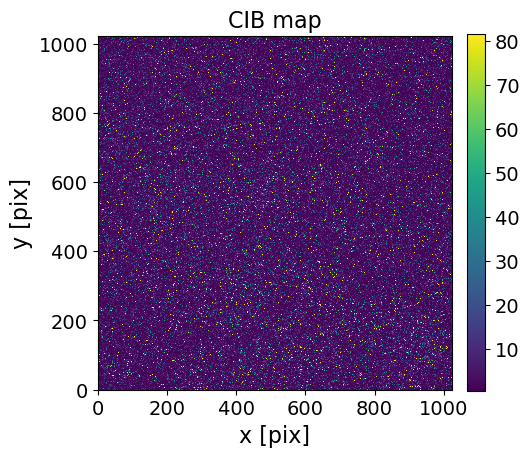

cI shot, cI2 shot, galshot, analytic bias: 1.6796961749707197e-06 4.403222740915243e-06 3.014656e-09 1.5073279999999998e-09
min max of image in plot map are  -201.74266833192974 190.78777738399307


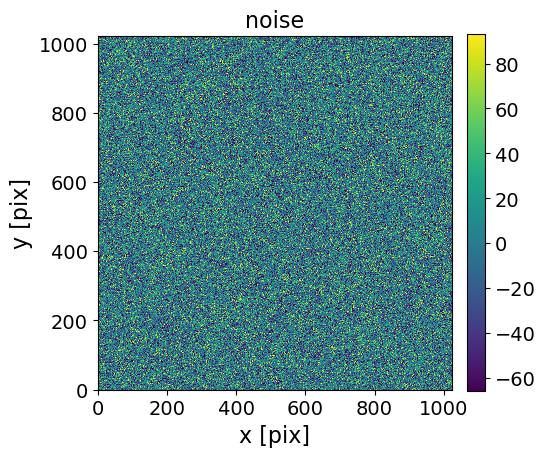

mean nell: 1.935674126604791e-06
min max of image in plot map are  -205.7136230315008 818.3757327038627


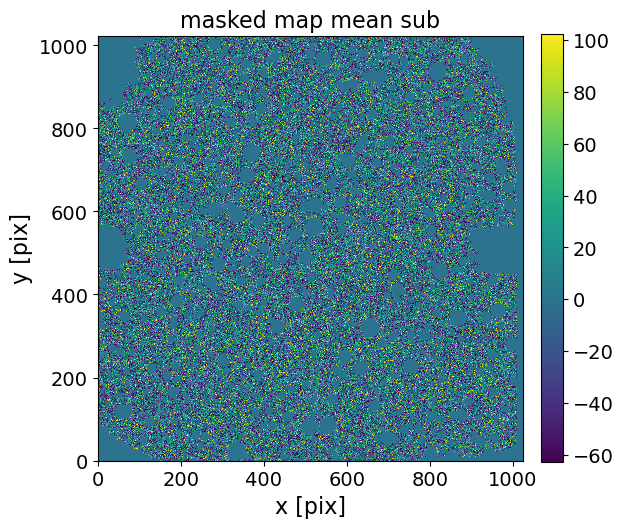

Beam function check over [lMin, lMax]:
  ell: [10000.         10333.91045433 10678.97052781 11035.55251788
 11404.04115338 11784.83400965 12178.34193749 12584.98950642
 13005.2154628  13439.47320318 13888.2312635  14351.97382461
 14831.20123463 15326.43054888 15838.19608767 16367.0500128
 16913.56292338 17478.32447139 18061.9439979  18665.05119055
 19288.29676286 19932.35315639 20597.91526622 21285.70119069
 21996.45300622 22730.93756791 23489.94733698 24274.30123572
 25084.84553114 25922.45474794 26788.03261216 27682.51302617
 28606.86107633 29562.07407422 30549.18263272 31569.25177795
 32623.38209835 33712.71093217 34838.41359457 36001.70464571
 37203.8392012  38446.11428624 39729.87023509 41056.49213715
 42427.41133142 43844.10695079 45308.10751795 46820.99259456
 48384.39448549 50000.        ]
  B(ell): [0.97786833 0.97651869 0.97512399 0.97344106 0.97157853 0.96965382
 0.96766483 0.96560943 0.9634854  0.96129045 0.95902221 0.95632891
 0.95334681 0.95026513 0.94708056 0.94378965 0.

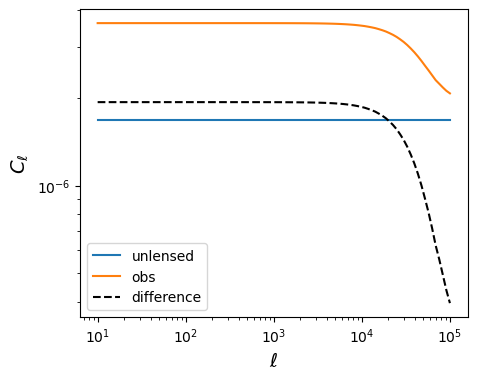

Using beam in normalization (proper B(ell)×B(L-ell) correction)
  -> Setting kcorr=1.0 (no additional correction)
obs map in compute_lensing_ps_quantities_v2 is  -1.5640700540275887e-15
lMin, lMax inputs to computeQuadEstKappaNorm: 10000.0 50000.0
min max of WFDataFourier real is  -9.095993501540386e-05 0.0001017592502677626
min max of WFDataFourier is  (-9.095993501540386e-05-1.4232339985177208e-05j) (0.0001017592502677626-1.7608336884168217e-05j)
Using FFT normalization with proper B(ℓ)×B(L-ℓ) beam correction
Doing full calculation: computeQuadEstPhiNormalizationFFT
Including beam corrections in normalization


/Users/richardfeder/Documents/ciber/FlatSkyQE/flat_map.py:1943: RuntimeWarning: divide by zero encountered in divide
  resultFourier = 1./resultFourier
/Users/richardfeder/Documents/ciber/FlatSkyQE/flat_map.py:1943: RuntimeWarning: invalid value encountered in divide
  resultFourier = 1./resultFourier


saving Fourier map toexample_kappa.npz
reading fourier map fromexample_kappa.npz
Filtering kappa estimate to L <= 50000.0
already have cibFourier..
Computing bispectrum with BANDPASS filter (hard cutoff)
Loading CIBER beam..
fsky =  0.00048481322570479725
KeysView(NpzFile '/Users/richardfeder/Documents/ciber/data/fluctuation_data/TM1//beam_correction/bl_est_postage_stamps_TM1_081121.npz' with keys: B_ells_post, ifield_list)
Deconvolving clII by B(ℓ)² to get true C^{II}
Computing L-dependent bispectrum beam correction...
L-dependent vbeam range: [0.000000, 0.140246]
vbeam before modefrac correction: [0.63194059 0.63194059 0.63194059 0.63194059 0.63194059 0.63193642
 0.63192809 0.63192809 0.6319059  0.63188788 0.63185183 0.6318213
 0.63181712 0.6317921  0.63173384 0.63165473 0.63157007 0.63146573
 0.6313226  0.63117254 0.63092803 0.63065256 0.63051592 0.62992924
 0.6290501  0.62873118 0.62753568 0.62648761 0.62519173 0.6232821
 0.62108139 0.61825817 0.61448985 0.60973111 0.60373817 0.596

/Users/richardfeder/Documents/ciber/FlatSkyQE/map_clus_utils.py:380: RuntimeWarning: divide by zero encountered in divide
  skewcl /= vbeam
/Users/richardfeder/Documents/ciber/FlatSkyQE/map_clus_utils.py:381: RuntimeWarning: divide by zero encountered in divide
  skewclerr /= vbeam


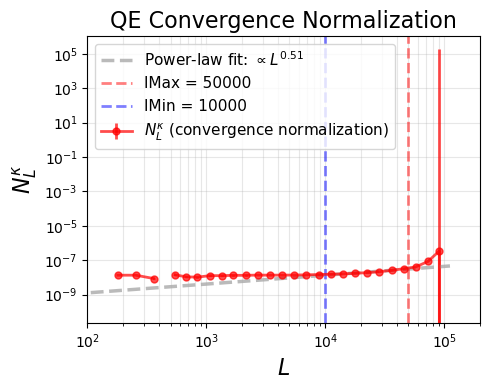

loading from  ../data/lens_prods/mock_dat/111125/TM1/mock_dat_unlensed_noiseless_JHlt16_nbar100000.0_simidx1.npz
tracer cat has shape  (400000, 4)
mean mask is  0.7573251724243164
cI shot, cI2 shot, galshot, analytic bias: 1.633368920642479e-06 4.281778623329019e-06 3.014656e-09 1.5073279999999998e-09
min max of image in plot map are  -185.87150631841754 200.12109439985127


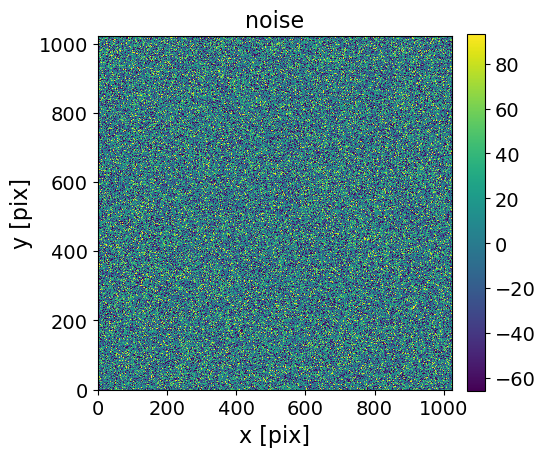

mean nell: 1.8882711892217536e-06
min max of image in plot map are  -192.0163087354146 852.6853406738377


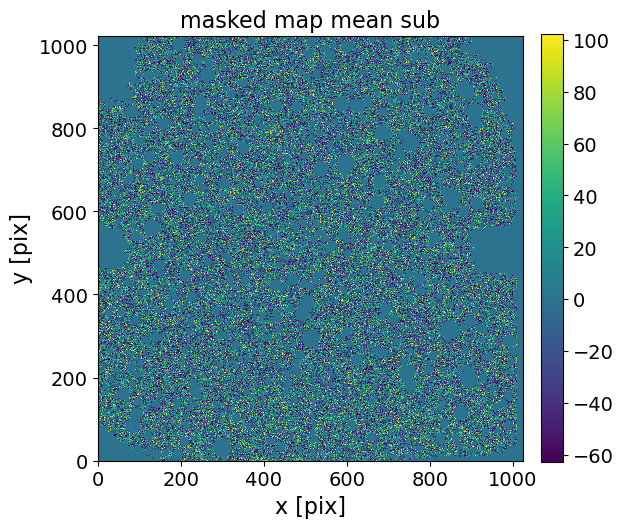

Beam function check over [lMin, lMax]:
  ell: [10000.         10333.91045433 10678.97052781 11035.55251788
 11404.04115338 11784.83400965 12178.34193749 12584.98950642
 13005.2154628  13439.47320318 13888.2312635  14351.97382461
 14831.20123463 15326.43054888 15838.19608767 16367.0500128
 16913.56292338 17478.32447139 18061.9439979  18665.05119055
 19288.29676286 19932.35315639 20597.91526622 21285.70119069
 21996.45300622 22730.93756791 23489.94733698 24274.30123572
 25084.84553114 25922.45474794 26788.03261216 27682.51302617
 28606.86107633 29562.07407422 30549.18263272 31569.25177795
 32623.38209835 33712.71093217 34838.41359457 36001.70464571
 37203.8392012  38446.11428624 39729.87023509 41056.49213715
 42427.41133142 43844.10695079 45308.10751795 46820.99259456
 48384.39448549 50000.        ]
  B(ell): [0.97786833 0.97651869 0.97512399 0.97344106 0.97157853 0.96965382
 0.96766483 0.96560943 0.9634854  0.96129045 0.95902221 0.95632891
 0.95334681 0.95026513 0.94708056 0.94378965 0.

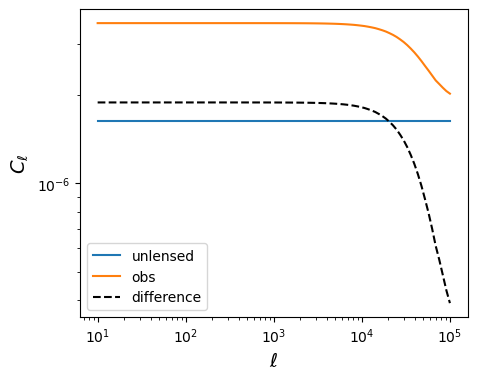

Using beam in normalization (proper B(ell)×B(L-ell) correction)
  -> Setting kcorr=1.0 (no additional correction)
obs map in compute_lensing_ps_quantities_v2 is  -1.2906342661267445e-15
lMin, lMax inputs to computeQuadEstKappaNorm: 10000.0 50000.0
min max of WFDataFourier real is  -8.72442000401259e-05 8.94537871269011e-05
min max of WFDataFourier is  (-8.72442000401259e-05-2.147471813062398e-05j) (8.94537871269011e-05-9.580766353820414e-06j)
Using FFT normalization with proper B(ℓ)×B(L-ℓ) beam correction
Doing full calculation: computeQuadEstPhiNormalizationFFT
Including beam corrections in normalization
saving Fourier map toexample_kappa.npz
reading fourier map fromexample_kappa.npz
Filtering kappa estimate to L <= 50000.0
already have cibFourier..
Computing bispectrum with BANDPASS filter (hard cutoff)
Loading CIBER beam..
fsky =  0.00048481322570479725
KeysView(NpzFile '/Users/richardfeder/Documents/ciber/data/fluctuation_data/TM1//beam_correction/bl_est_postage_stamps_TM1_081121.n

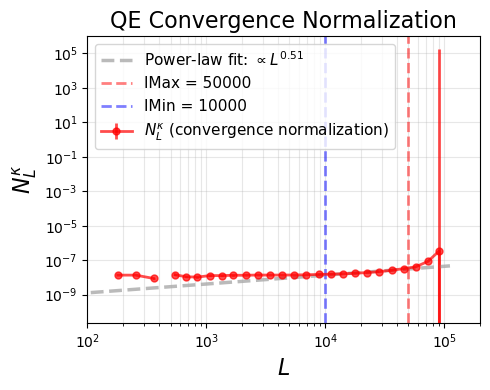

loading from  ../data/lens_prods/mock_dat/111125/TM1/mock_dat_unlensed_noiseless_JHlt16_nbar100000.0_simidx2.npz
tracer cat has shape  (400000, 4)
mean mask is  0.7537031173706055
cI shot, cI2 shot, galshot, analytic bias: 1.5805344702386052e-06 4.143276281662289e-06 3.014656e-09 1.5073279999999998e-09
min max of image in plot map are  -181.54507458257783 184.41595638441197


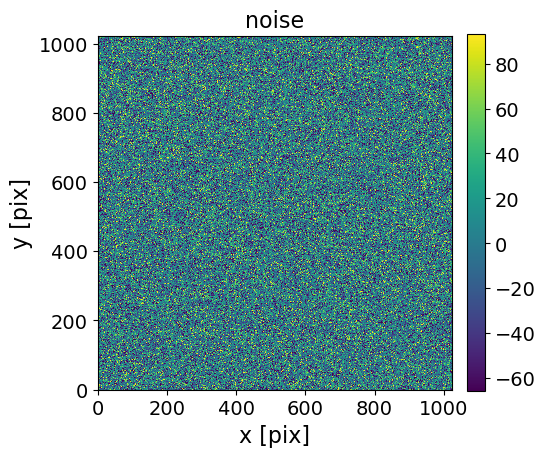

mean nell: 1.8435063550294497e-06
min max of image in plot map are  -184.10012145272822 825.9542002334084


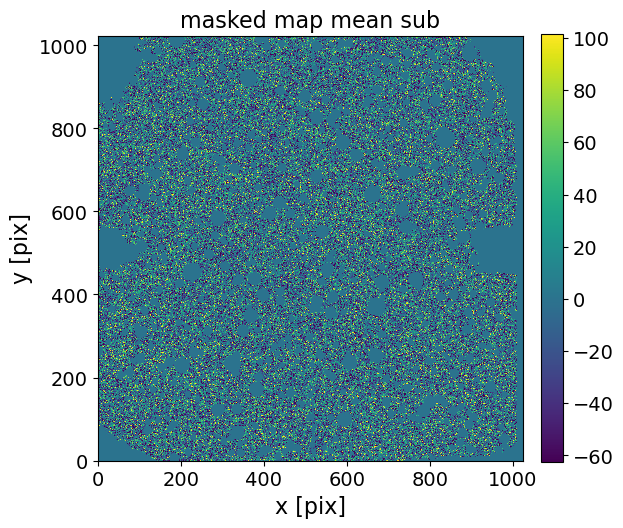

Beam function check over [lMin, lMax]:
  ell: [10000.         10333.91045433 10678.97052781 11035.55251788
 11404.04115338 11784.83400965 12178.34193749 12584.98950642
 13005.2154628  13439.47320318 13888.2312635  14351.97382461
 14831.20123463 15326.43054888 15838.19608767 16367.0500128
 16913.56292338 17478.32447139 18061.9439979  18665.05119055
 19288.29676286 19932.35315639 20597.91526622 21285.70119069
 21996.45300622 22730.93756791 23489.94733698 24274.30123572
 25084.84553114 25922.45474794 26788.03261216 27682.51302617
 28606.86107633 29562.07407422 30549.18263272 31569.25177795
 32623.38209835 33712.71093217 34838.41359457 36001.70464571
 37203.8392012  38446.11428624 39729.87023509 41056.49213715
 42427.41133142 43844.10695079 45308.10751795 46820.99259456
 48384.39448549 50000.        ]
  B(ell): [0.97786833 0.97651869 0.97512399 0.97344106 0.97157853 0.96965382
 0.96766483 0.96560943 0.9634854  0.96129045 0.95902221 0.95632891
 0.95334681 0.95026513 0.94708056 0.94378965 0.

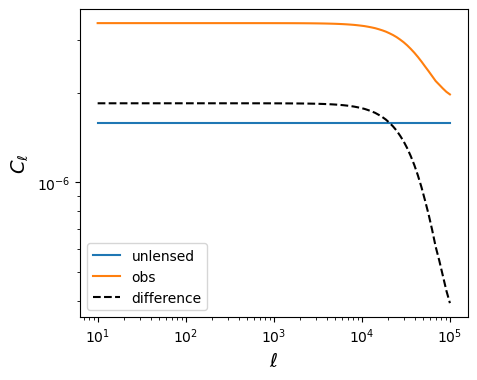

Using beam in normalization (proper B(ell)×B(L-ell) correction)
  -> Setting kcorr=1.0 (no additional correction)
obs map in compute_lensing_ps_quantities_v2 is  -4.865899350114944e-16
lMin, lMax inputs to computeQuadEstKappaNorm: 10000.0 50000.0
min max of WFDataFourier real is  -7.786367919994398e-05 8.579267587275141e-05
min max of WFDataFourier is  (-7.786367919994398e-05+2.7355983597397576e-05j) (8.579267587275141e-05+4.0728274509717726e-05j)
Using FFT normalization with proper B(ℓ)×B(L-ℓ) beam correction
Doing full calculation: computeQuadEstPhiNormalizationFFT
Including beam corrections in normalization
saving Fourier map toexample_kappa.npz
reading fourier map fromexample_kappa.npz
Filtering kappa estimate to L <= 50000.0
already have cibFourier..
Computing bispectrum with BANDPASS filter (hard cutoff)
Loading CIBER beam..
fsky =  0.00048481322570479725
KeysView(NpzFile '/Users/richardfeder/Documents/ciber/data/fluctuation_data/TM1//beam_correction/bl_est_postage_stamps_TM1_081

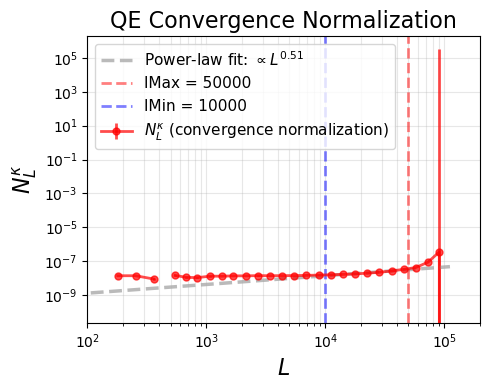

loading from  ../data/lens_prods/mock_dat/111125/TM1/mock_dat_unlensed_noiseless_JHlt16_nbar100000.0_simidx3.npz
tracer cat has shape  (400000, 4)
mean mask is  0.7529325485229492
cI shot, cI2 shot, galshot, analytic bias: 1.6141941128600256e-06 4.231513015215785e-06 3.014656e-09 1.507328e-09
min max of image in plot map are  -211.87195021582863 187.27715564189992


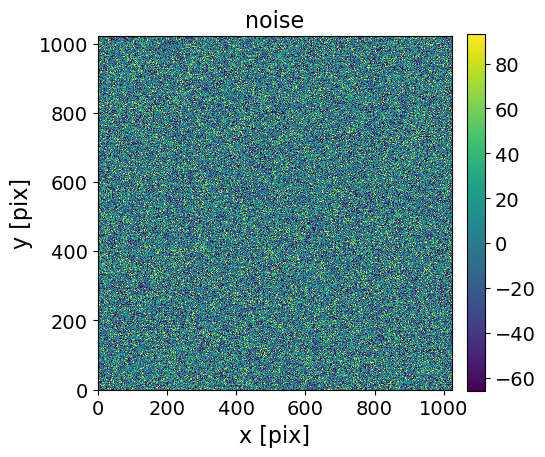

mean nell: 1.747740242814543e-06
min max of image in plot map are  -206.27595561354943 826.4680538376005


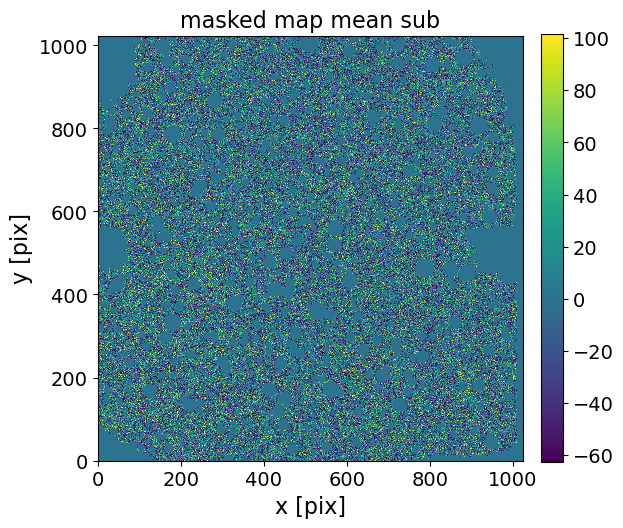

Beam function check over [lMin, lMax]:
  ell: [10000.         10333.91045433 10678.97052781 11035.55251788
 11404.04115338 11784.83400965 12178.34193749 12584.98950642
 13005.2154628  13439.47320318 13888.2312635  14351.97382461
 14831.20123463 15326.43054888 15838.19608767 16367.0500128
 16913.56292338 17478.32447139 18061.9439979  18665.05119055
 19288.29676286 19932.35315639 20597.91526622 21285.70119069
 21996.45300622 22730.93756791 23489.94733698 24274.30123572
 25084.84553114 25922.45474794 26788.03261216 27682.51302617
 28606.86107633 29562.07407422 30549.18263272 31569.25177795
 32623.38209835 33712.71093217 34838.41359457 36001.70464571
 37203.8392012  38446.11428624 39729.87023509 41056.49213715
 42427.41133142 43844.10695079 45308.10751795 46820.99259456
 48384.39448549 50000.        ]
  B(ell): [0.97786833 0.97651869 0.97512399 0.97344106 0.97157853 0.96965382
 0.96766483 0.96560943 0.9634854  0.96129045 0.95902221 0.95632891
 0.95334681 0.95026513 0.94708056 0.94378965 0.

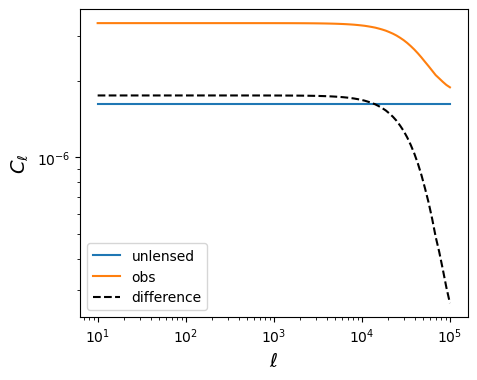

Using beam in normalization (proper B(ell)×B(L-ell) correction)
  -> Setting kcorr=1.0 (no additional correction)
obs map in compute_lensing_ps_quantities_v2 is  7.901665433074356e-16
lMin, lMax inputs to computeQuadEstKappaNorm: 10000.0 50000.0
min max of WFDataFourier real is  -8.893164892865778e-05 8.847318992506144e-05
min max of WFDataFourier is  (-8.893164892865778e-05-3.752144347885909e-06j) (8.847318992506144e-05+1.6557996246430567e-05j)
Using FFT normalization with proper B(ℓ)×B(L-ℓ) beam correction
Doing full calculation: computeQuadEstPhiNormalizationFFT
Including beam corrections in normalization


KeyboardInterrupt: 

In [2]:
# psf_pix_fwhm = None

# lMax = 8e4

lMax_range = [5e4, 6e4, 7e4, 9e4]
# lMax_range = [8e4]
# lMax_range = [8e4, 7e4, 6e4, 5e4, 4e4]

# fwhms = [0.5, None, 2.0]
fwhms = [None] # CIBER best fit PSF

nsim = 5
pixel_fn_correct=False
# apply_mask = True

lensmode='unlensed'

nbar = 1e5
mockstr = 'noiseless_JHlt16_nbar'+str(nbar)

exact_beam = True
use_precomp = False
save = True

all_res_fpath = []

for apply_mask in [True]:
    for lMax in lMax_range:

        for add_noise in [True]:

            for psf_pix_fwhm in fwhms:

                if psf_pix_fwhm is None:
                    grab_cib_sim = True
                    sigma_noise_pix = 40
                else:
                    grab_cib_sim = False
                    sigma_noise_pix = 5

#                 res = delta_fn_sources_test(nsim=nsim, lMax=lMax, lMin=1e4, add_noise=add_noise,
#                                             sigma_noise_pix=sigma_noise_pix, psf_pix_fwhm=psf_pix_fwhm,
#                                            N_CIB_PER_PIXEL=0.2, N_G_PER_PIXEL=0.2, alpha=0., plot=True, 
#                                            grab_cib_sim=grab_cib_sim, datestr='111125', apply_mask=apply_mask, 
#                                            pixel_fn_correct=pixel_fn_correct, 
#                                            lensmode=lensmode, mockstr=mockstr,
#                                            use_beam_in_norm=exact_beam, skew_filter_mode='bandpass', 
#                                            s_max=10.0)

#                 fig_fpath = '../figures/clkg_delta_fn_srcs_with_prediction_lmin1e4_lmax'+str(lMax)

                resname = 'clkg_'+lensmode+'_srcs_with_prediction_lmin1e4_lmax'+str(lMax)
        
                if grab_cib_sim:
                    resname += '_CIBERbeam'
                else:
                    resname += '_PSFFWHM='+str(psf_pix_fwhm)
                if add_noise:
                    resname += '_wnoise'
                else:
                    resname += '_noiseless'
                if apply_mask:
                    resname += '_wmask'
                else:
                    resname += '_unmasked'
                if exact_beam:
                    resname += '_exactbeam'
                if pixel_fn_correct:
                    resname += '_wpixcorr'
        
                res_fpath= 'res/res_'+resname+'_122625.npz'
            
                if os.path.exists(res_fpath) and use_precomp:
                    print('Loading pre-computed configuration results from ', res_fpath)
                    res = np.load(res_fpath)
                    
                else:
                    print('Result file does not exist or use_precomp=False, calculating..')
                    res = delta_fn_sources_test(nsim=nsim, lMax=lMax, lMin=1e4, add_noise=add_noise,
                                    sigma_noise_pix=sigma_noise_pix, psf_pix_fwhm=psf_pix_fwhm,
                                   N_CIB_PER_PIXEL=0.2, N_G_PER_PIXEL=0.2, alpha=0., plot=True, 
                                   grab_cib_sim=grab_cib_sim, datestr='111125', apply_mask=apply_mask, 
                                   pixel_fn_correct=pixel_fn_correct, 
                                   lensmode=lensmode, mockstr=mockstr,
                                   use_beam_in_norm=exact_beam, skew_filter_mode='bandpass', 
                                   s_max=10.0)

                
                fig_fpath = '../figures/120125/'

                suptitle= gen_suptitle(grab_cib_sim, add_noise, apply_mask, exact_beam=False, psf_pix_fwhm=psf_pix_fwhm)

                    
                fig_fpath += resname

                
                suptitle += '\n$'+str(10000)+'<\\ell<'+str(int(lMax))+'$'
                # suptitle = 'Gaussian PSF FWHM=1.3 pix, noiseless'
                fig = plot_recov_components(res, bbox_to_anchor=None, ncol=1, ylim=None,
                                            figsize=(9, 6.5), markersize=5, legend_fs=10, 
                                           xlim=[100, 1e5], loc=3, suptitle=suptitle, lMax=lMax, lMin=1e4)

                fig_fpath += '_122625_nbar'+str(nbar)+'.png'
                fig.savefig(fig_fpath, dpi=200)
                
                res_fpath= 'res/res_'+resname+'_122625.npz'

                all_res_fpath.append(res_fpath)
                
                if save:
                    np.savez(res_fpath, **res)

#             fig.savefig('../figures/clkg_delta_fn_srcs_with_prediction_lmin1e4_lmax'+str(lMax)+'_noiseless_CIBERbeam_122625_wBLcorr.pdf')



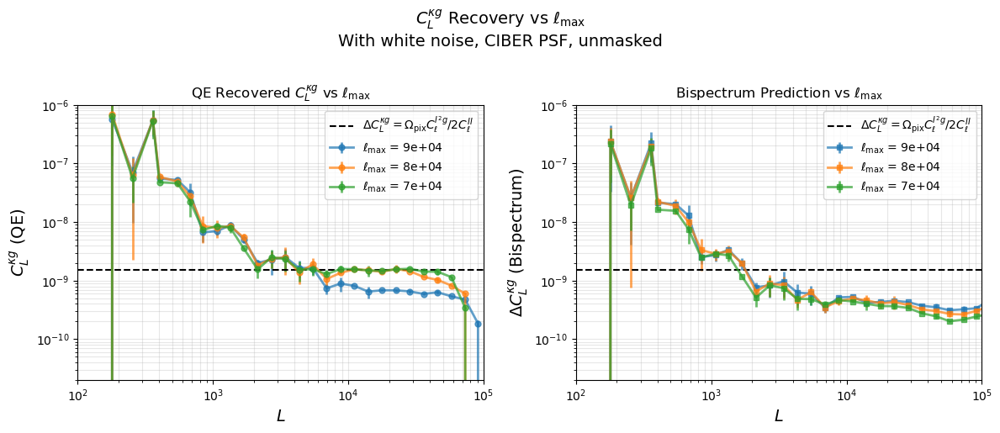

In [10]:
# Collect and plot C_L^kg estimates for different lMax values
import re

# runstr = 'Noiseless, CIBER PSF, unmasked'
runstr = 'With white noise, CIBER PSF, unmasked'

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

colors = ['C0', 'C1', 'C2', 'C3', 'C4']

# Left panel: QE recovered C_L^kg
ax = axes[0]
for i, res_fpath in enumerate(all_res_fpath):
    # Load the results
    res_data = np.load(res_fpath, allow_pickle=True)
    
    lC = res_data['lC']
    clkg = res_data['clkg']  # QE measurement
    
    # Get mean and std across simulations
    clkg_mean = np.mean(clkg, axis=0)
    clkg_err = np.std(clkg, axis=0)
    
    # Extract lMax from filename
    lmax_match = re.search(r'lmax(\d+\.?\d*[eE]?\+?\d*)', res_fpath)
    if lmax_match:
        lmax_str = lmax_match.group(1)
        lmax_val = float(lmax_str)
        label = f'$\\ell_{{\\rm max}}$ = {lmax_val:.0e}'
    else:
        label = f'Run {i+1}'
    
    # Plot with error bars
    ax.errorbar(lC, clkg_mean, yerr=clkg_err, 
                fmt='o-', label=label, alpha=0.7, markersize=5, 
                color=colors[i % len(colors)], linewidth=2)
    
ax.axhline(res_data['analytic_bias'], label='$\\Delta C_{L}^{\\kappa g}=\\Omega_{\\rm pix}C_{\\ell}^{I^2g}/2C_{\\ell}^{II}$', color='k', linestyle='dashed')    


# Add filter boundaries for the last configuration
if 'lMin' in res_data and 'lMax' in res_data:
    lMin = float(res_data['lMin'])
    lMax = float(res_data['lMax'])
    ax.axvline(lMin, color='gray', linestyle='--', alpha=0.5, label='Filter boundaries')
    ax.axvline(lMax, color='gray', linestyle='--', alpha=0.5)

ax.set_xscale('log')
ax.set_yscale('log')
ax.set_ylim(2e-11, 1e-6)

ax.set_xlabel('$L$', fontsize=14)
ax.set_ylabel('$C_L^{\\kappa g}$ (QE)', fontsize=14)
ax.set_title('QE Recovered $C_L^{\\kappa g}$ vs $\\ell_{\\rm max}$', fontsize=12)
ax.legend(loc='best', fontsize=10)
ax.grid(True, alpha=0.3, which='both')
ax.set_xlim(1e2, 1e5)

# Right panel: Bispectrum prediction ΔC_L^kg
ax = axes[1]
for i, res_fpath in enumerate(all_res_fpath):
    # Load the results
    res_data = np.load(res_fpath, allow_pickle=True)
    
    lC = res_data['lC']
    dclkg = res_data['dclkg']  # Bispectrum prediction
    
    # Get mean and std across simulations
    dclkg_mean = np.mean(dclkg, axis=0)
    dclkg_err = np.std(dclkg, axis=0)
    
    # Extract lMax from filename
    lmax_match = re.search(r'lmax(\d+\.?\d*[eE]?\+?\d*)', res_fpath)
    if lmax_match:
        lmax_str = lmax_match.group(1)
        lmax_val = float(lmax_str)
        label = f'$\\ell_{{\\rm max}}$ = {lmax_val:.0e}'
    else:
        label = f'Run {i+1}'
    
    # Plot with error bars
    ax.errorbar(lC, dclkg_mean, yerr=dclkg_err, 
                fmt='s-', label=label, alpha=0.7, markersize=5, 
                color=colors[i % len(colors)], linewidth=2)
    

ax.axhline(res_data['analytic_bias'], label='$\\Delta C_{L}^{\\kappa g}=\\Omega_{\\rm pix}C_{\\ell}^{I^2g}/2C_{\\ell}^{II}$', color='k', linestyle='dashed')    


# Add filter boundaries
if 'lMin' in res_data and 'lMax' in res_data:
    ax.axvline(lMin, color='gray', linestyle='--', alpha=0.5, label='Filter boundaries')
    ax.axvline(lMax, color='gray', linestyle='--', alpha=0.5)

ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel('$L$', fontsize=14)
ax.set_ylabel('$\\Delta C_L^{\\kappa g}$ (Bispectrum)', fontsize=14)
ax.set_title('Bispectrum Prediction vs $\\ell_{\\rm max}$', fontsize=12)
ax.legend(loc='best', fontsize=10)
ax.grid(True, alpha=0.3, which='both')
ax.set_ylim(2e-11, 1e-6)
ax.set_xlim(1e2, 1e5)

plt.suptitle('$C_L^{\\kappa g}$ Recovery vs $\\ell_{\\rm max}$\n'+runstr, fontsize=14, y=1.02)
plt.tight_layout()
# plt.savefig('../figures/clkg_recovery_vs_lmax_noiseless_CIBERPSF_unmasked_122325_skewspec.png', bbox_inches='tight', dpi=200)
plt.show()

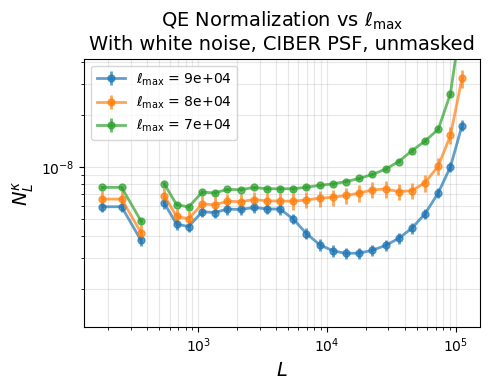

In [11]:
# Collect and plot N_L_kappa estimates for different lMax values
import re

runstr = 'With white noise, CIBER PSF, unmasked'
# runstr = 'Noiseless, CIBER PSF, unmasked'

plt.figure(figsize=(5, 4))

colors = ['C0', 'C1', 'C2', 'C3', 'C4']

for i, res_fpath in enumerate(all_res_fpath):
    # Load the results
    res_data = np.load(res_fpath, allow_pickle=True)
    
    lC = res_data['lC']
    N_L_kappa = res_data['N_L_kappa']
    
    # Get mean and std across simulations
    N_L_mean = np.mean(N_L_kappa, axis=0)
    N_L_err = np.std(N_L_kappa, axis=0)
    
    # Extract lMax from filename
    lmax_match = re.search(r'lmax(\d+\.?\d*[eE]?\+?\d*)', res_fpath)
    if lmax_match:
        lmax_str = lmax_match.group(1)
        lmax_val = float(lmax_str)
        label = f'$\\ell_{{\\rm max}}$ = {lmax_val:.0e}'
    else:
        label = f'Run {i+1}'
    
    # Plot with error bars
    plt.errorbar(lC, N_L_mean, yerr=N_L_err, 
                fmt='o-', label=label, alpha=0.7, markersize=5, 
                color=colors[i % len(colors)], linewidth=2)

# Add filter boundaries for the last configuration
if 'lMin' in res_data and 'lMax' in res_data:
    lMin = float(res_data['lMin'])
    lMax = float(res_data['lMax'])
    plt.axvline(lMin, color='gray', linestyle='--', alpha=0.5, label='Filter boundaries')
    plt.axvline(lMax, color='gray', linestyle='--', alpha=0.5)

plt.xscale('log')
plt.yscale('log')
plt.xlabel('$L$', fontsize=14)
plt.ylabel('$N_L^\\kappa$', fontsize=14)
plt.title('QE Normalization vs $\\ell_{\\rm max}$\n'+runstr, fontsize=14)
plt.legend(loc='best', fontsize=10)
plt.grid(True, alpha=0.3, which='both')
plt.ylim(1.2e-9, 4.2e-8)
plt.tight_layout()
# plt.savefig('../figures/qe_normalization_kappa_vs_lmax_noiseless_CIBERPSF_unmasked_122325.png', bbox_inches='tight', dpi=200)
plt.show()

loading mock sims from  ../data/lens_prods/mock_dat/111125/TM1/mock_dat_randomized_photnoiseonly_JHlt16_nbar10000.0_simidx1.npz
ng per pix: 0.03814697265625
[5.23564063e-07 3.77872660e-07 8.96287606e-07 1.91323803e-06
 1.00327439e-06 1.58335029e-06 1.94263442e-06 1.55528889e-06
 1.76837027e-06 1.41831040e-06 1.53313534e-06 1.53211328e-06
 1.52702304e-06 1.61138240e-06 1.51661150e-06 1.47365594e-06
 1.41415709e-06 1.36416385e-06 1.26094063e-06 1.09082183e-06
 8.68365080e-07 6.13132777e-07 3.65068818e-07 2.00722477e-07
 9.18160130e-08]
fsky =  0.00048481322570479725
KeysView(NpzFile '/Users/richardfeder/Documents/ciber/data/fluctuation_data/TM1//beam_correction/bl_est_postage_stamps_TM1_081121.npz' with keys: B_ells_post, ifield_list)


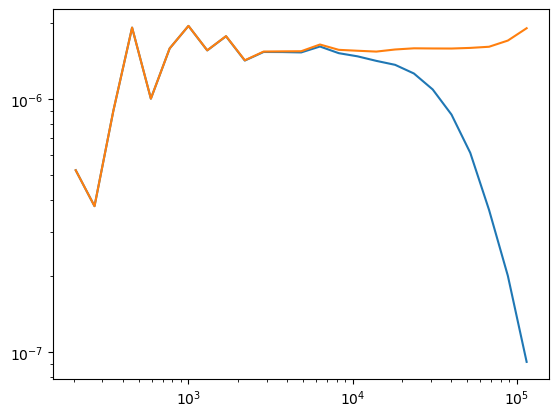

lMin, lMax inputs to computeQuadEstKappaNorm: 10000 80000
min max of WFDataFourier real is  -0.00011860858158638207 0.00013943505009957372
min max of WFDataFourier is  (-0.00011860858158638207-2.677501396510688e-05j) (0.00013943505009957372+3.0773507972756305e-06j)
Doing full calculation: computeQuadEstPhiNormalizationFFT


/Users/richardfeder/Documents/ciber/FlatSkyQE/flat_map.py:2032: RuntimeWarning: divide by zero encountered in divide
  resultFourier = 1./resultFourier
/Users/richardfeder/Documents/ciber/FlatSkyQE/flat_map.py:2032: RuntimeWarning: invalid value encountered in divide
  resultFourier = 1./resultFourier


saving Fourier map toexample_kappa.npz
reading fourier map fromexample_kappa.npz
min max of image in plot map are  -73.05468662546996 279.69095894642743


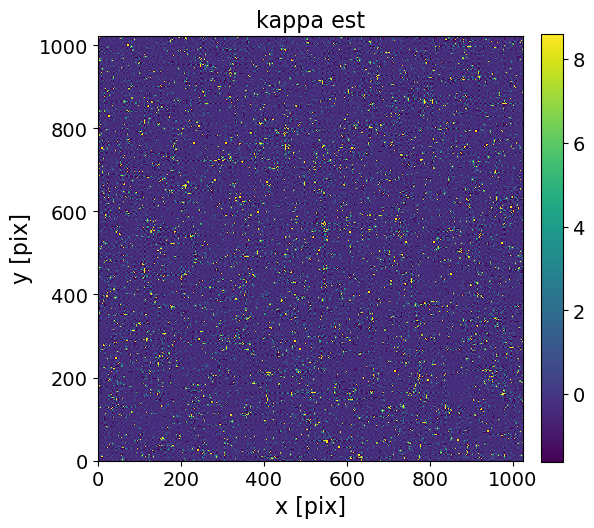

min max of image in plot map are  -1.0 77.6432


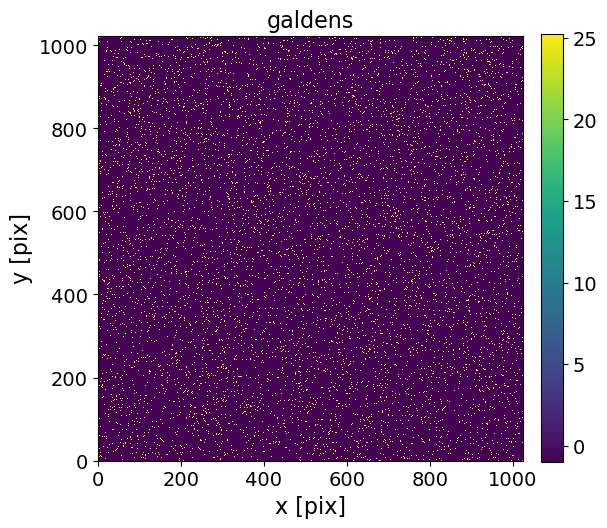

/var/folders/5h/8p21xc_n2j96l9fnp8fm1vbw0000gn/T/ipykernel_80763/3910201511.py:39: RuntimeWarning: invalid value encountered in divide
  'dclkg':cl_bis*Apix/(2*clII), 'kappa_est_map':kappa_est_map, 'kappa_true':kappa_true, 'galdens':galdens}


In [ ]:
datestr = '111125'
ciber_inst = 1
lensmode = 'randomized'
simidx = 1
fieldidx = 0
MAP_SIZE = 1024

Apix = 1.15e-9
nbar = 1e4

mockstr = 'photnoiseonly_JHlt16_nbar'+str(nbar)

tmdir = '../data/lens_prods/mock_dat/'+datestr+'/TM'+str(ciber_inst)
mock_sim_fpath = tmdir + '/mock_dat_'+lensmode+'_'+mockstr+'_simidx'+str(simidx)+'.npz'

print('loading mock sims from ', mock_sim_fpath)



mock_dat = np.load(mock_sim_fpath, allow_pickle=True)
cib_intensity_map, kappa_map, total_signal, galcounts = [mock_dat[key][fieldidx] for key in ['cib_maps', 'kappa_maps', 'total_signal', 'galdens']]


N_CIB_PER_PIXEL = np.sum(galcounts)/MAP_SIZE**2
N_G_PER_PIXEL = np.sum(galcounts)/MAP_SIZE**2

print('ng per pix:', N_G_PER_PIXEL)

# # --- 4. Calculate the Analytic Bias ---
# analytic_bias, c_i_shot, c_i2_g_shot, galshot = calculate_analytic_bias(
#     n_cib_per_pixel=N_CIB_PER_PIXEL,
#     n_g_per_pixel=N_G_PER_PIXEL,
#     fluxes_cib=all_cib_fluxes,
#     fluxes_g=galaxy_fluxes,
#     pix_area=Apix
# )

cib_intensity_map -= np.mean(cib_intensity_map)


lb, clauto_sky, clerr_sky = get_power_spec(cib_intensity_map, weights=None, nbins=26)
mean_cl_sky = np.mean(clauto_sky[((lb > lMin)*(lb < lMax))])
clauto_unlensed_true = clauto_sky

print(clauto_sky)

def const(ell):
    return mean_cl_sky


clf = ciber_lens_forecast(ell_min=1, ell_max=1.1e5)
clf.load_bl(ciber_inst, 4, inplace=True, plot=False)



ciber_obs_auto = interp1d(lb, clauto_unlensed_true, kind='linear', bounds_error=False, fill_value=0.)  


ciber_unlensed_auto = interp1d(lb, clauto_unlensed_true/clf.bl(lb)**2, kind='linear', bounds_error=False, fill_value=0.)  


plt.figure()
plt.plot(lb, ciber_obs_auto(lb), label='obs auto')
plt.plot(lb, ciber_unlensed_auto(lb), label='unlensed auto')

plt.xscale('log')
plt.yscale('log')
plt.show()



dataFourier = baseMap.fourier(cib_intensity_map)


psres = compute_lensing_ps_quantities2(baseMap, galcounts, const, const,
                                 param_dict, dataFourier, False, path_k, cib_intensity_map, cib_intensity_map,
                                 mask=mask, cut_lxly=False, mode='qe_kappa_norm', 
                                 Apix=Apix, lMin=lMin, lMax=lMax)





self.l has shape [[    0.           180.           360.         ... 91800.
  91980.         92160.        ]
 [  180.           254.55844123   402.49223595 ... 91800.17647042
  91980.17612508 92160.17578108]
 [  360.           402.49223595   509.11688245 ... 91800.70587964
  91980.70449828 92160.70312232]
 ...
 [  540.           569.20997883   648.99922958 ... 91801.58822156
  91981.58511354 92161.58201767]
 [  360.           402.49223595   509.11688245 ... 91800.70587964
  91980.70449828 92160.70312232]
 [  180.           254.55844123   402.49223595 ... 91800.17647042
  91980.17612508 92160.17578108]]
Generating a 1024x1024 map with 209715 sources...
lMin, lMax inputs to computeQuadEstKappaNorm: 10000 80000
min max of WFDataFourier real is  -9.08018222551839e-06 9.662466586355711e-06
min max of WFDataFourier is  (-9.08018222551839e-06+4.2376307986577136e-07j) (9.662466586355711e-06-2.9734323722873236e-06j)
Doing full calculation: computeQuadEstPhiNormalizationFFT
saving Fourier map toe

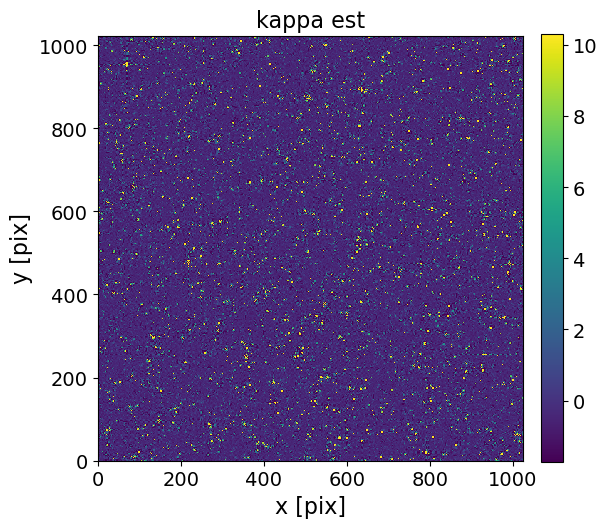

min max of image in plot map are  -1.0 38.99984741269145


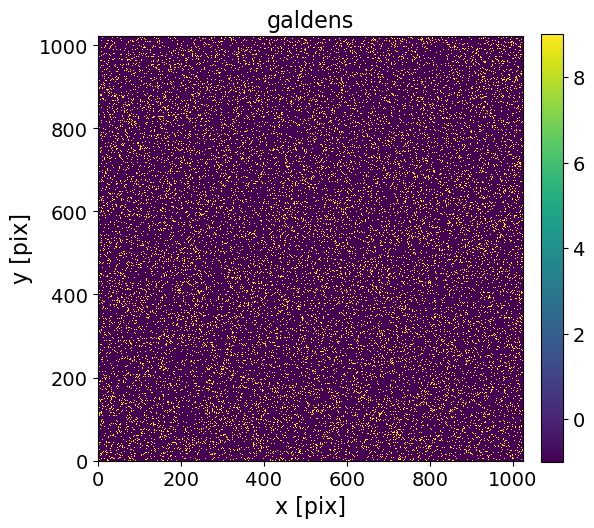

/var/folders/5h/8p21xc_n2j96l9fnp8fm1vbw0000gn/T/ipykernel_80763/404674758.py:44: RuntimeWarning: invalid value encountered in divide
  'dclkg':cl_bis*Apix/(2*clII), 'kappa_est_map':kappa_est_map, 'kappa_true':kappa_true, 'galdens':galdens}


Generating a 1024x1024 map with 209715 sources...
lMin, lMax inputs to computeQuadEstKappaNorm: 10000 80000
min max of WFDataFourier real is  -9.08018222551839e-06 9.662466586355711e-06
min max of WFDataFourier is  (-9.08018222551839e-06+4.2376307986577136e-07j) (9.662466586355711e-06-2.9734323722873236e-06j)
Doing full calculation: computeQuadEstPhiNormalizationFFT
saving Fourier map toexample_kappa.npz
reading fourier map fromexample_kappa.npz
min max of image in plot map are  -91.79110377634484 502.81643667149774


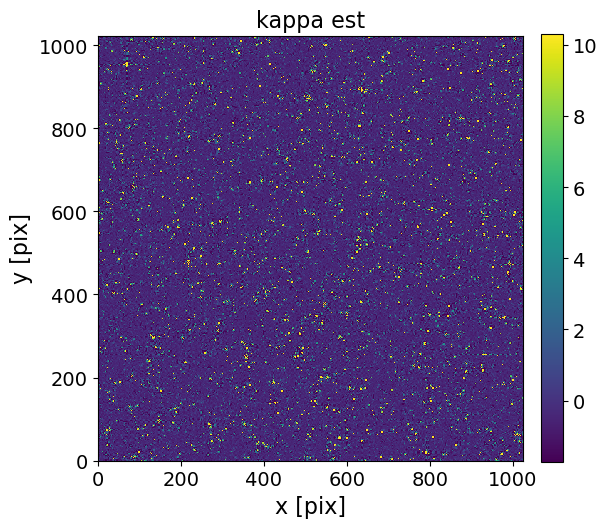

min max of image in plot map are  -1.0 38.99984741269145


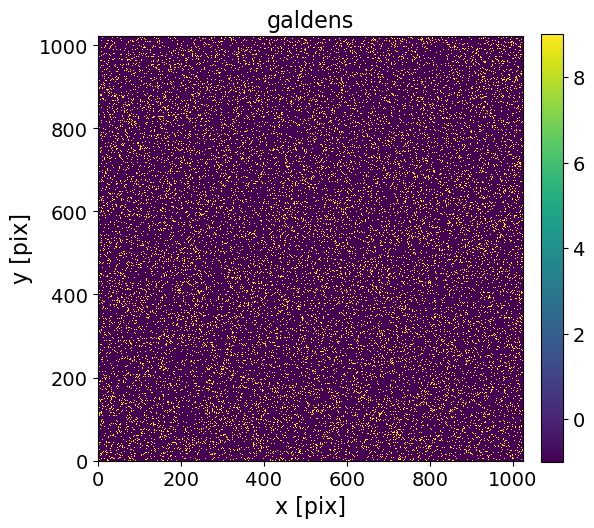

Generating a 1024x1024 map with 209715 sources...
lMin, lMax inputs to computeQuadEstKappaNorm: 10000 80000
min max of WFDataFourier real is  -9.08018222551839e-06 9.662466586355711e-06
min max of WFDataFourier is  (-9.08018222551839e-06+4.2376307986577136e-07j) (9.662466586355711e-06-2.9734323722873236e-06j)
Doing full calculation: computeQuadEstPhiNormalizationFFT
saving Fourier map toexample_kappa.npz
reading fourier map fromexample_kappa.npz
min max of image in plot map are  -91.79110377634484 502.81643667149774


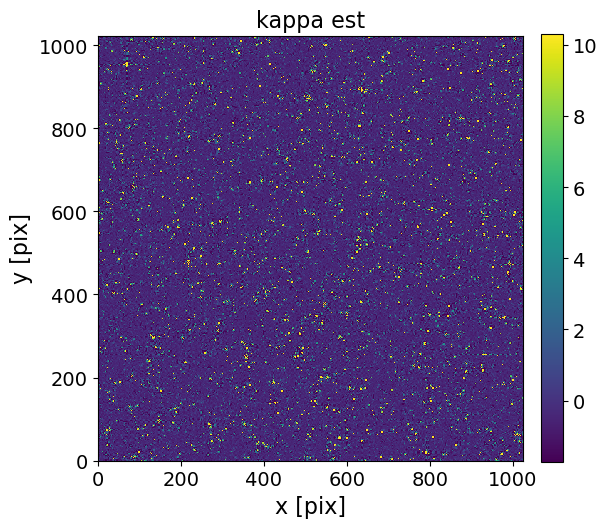

min max of image in plot map are  -1.0 38.99984741269145


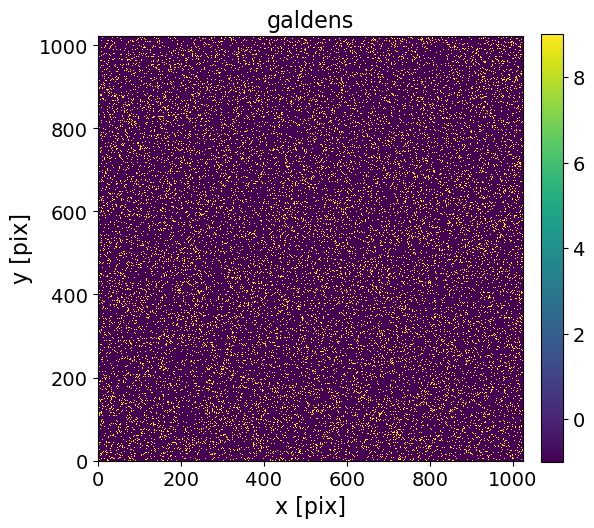

Generating a 1024x1024 map with 209715 sources...
lMin, lMax inputs to computeQuadEstKappaNorm: 10000 80000
min max of WFDataFourier real is  -9.08018222551839e-06 9.662466586355711e-06
min max of WFDataFourier is  (-9.08018222551839e-06+4.2376307986577136e-07j) (9.662466586355711e-06-2.9734323722873236e-06j)
Doing full calculation: computeQuadEstPhiNormalizationFFT
saving Fourier map toexample_kappa.npz
reading fourier map fromexample_kappa.npz
min max of image in plot map are  -91.79110377634484 502.81643667149774


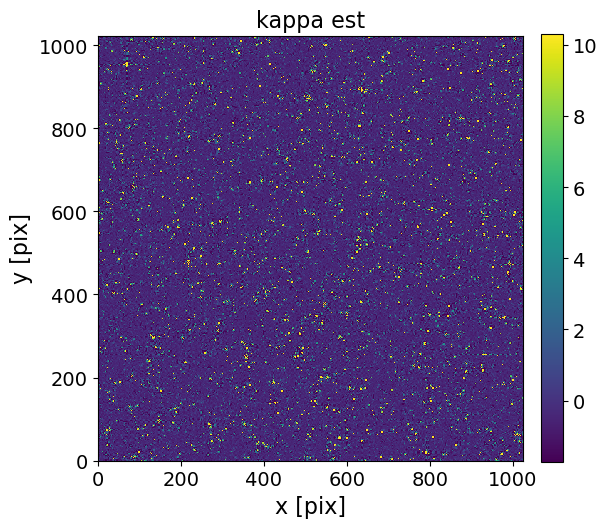

min max of image in plot map are  -1.0 38.99984741269145


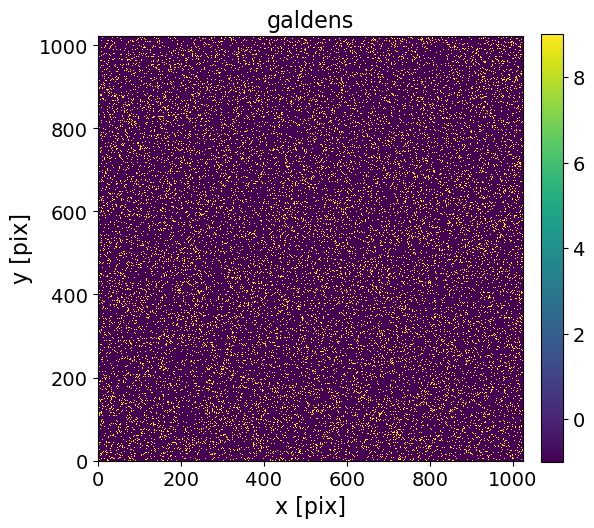

Generating a 1024x1024 map with 209715 sources...
lMin, lMax inputs to computeQuadEstKappaNorm: 10000 80000
min max of WFDataFourier real is  -9.08018222551839e-06 9.662466586355711e-06
min max of WFDataFourier is  (-9.08018222551839e-06+4.2376307986577136e-07j) (9.662466586355711e-06-2.9734323722873236e-06j)
Doing full calculation: computeQuadEstPhiNormalizationFFT
saving Fourier map toexample_kappa.npz
reading fourier map fromexample_kappa.npz
min max of image in plot map are  -91.79110377634484 502.81643667149774


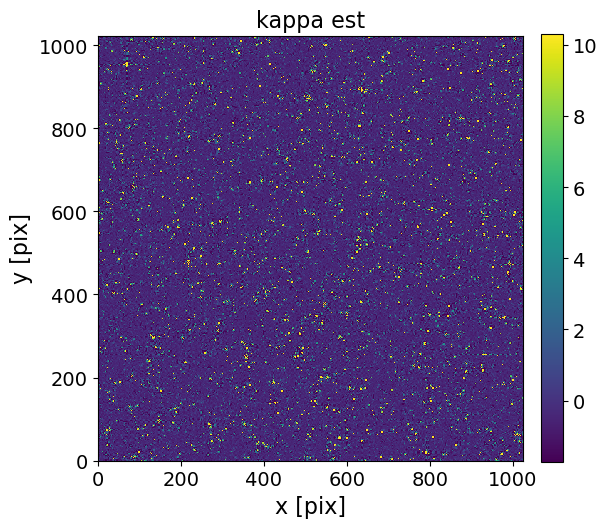

min max of image in plot map are  -1.0 38.99984741269145


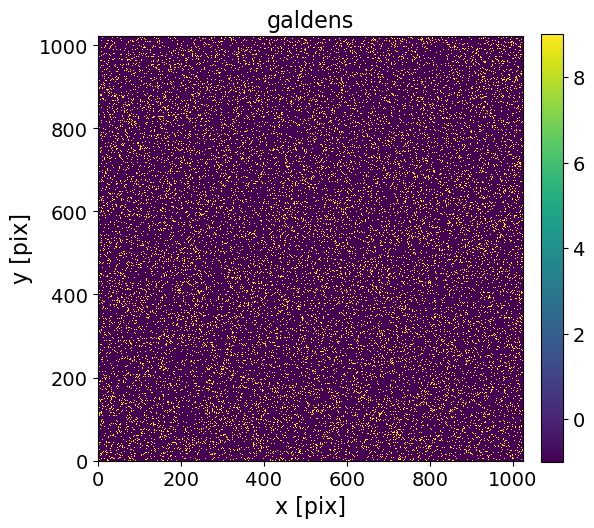

In [ ]:
MAP_SIZE = 1024
# Source population properties
N_CIB_PER_PIXEL = 0.2  # Average 1 source every 20 pixels
# For the special case check, we set the tracer density equal to the CIB density
N_G_PER_PIXEL = 0.1
Apix=1.15e-9
sizeX, sizeY = 2., 2.

lMin, lMax = 10000, 80000

baseMap = FlatMap(nX=MAP_SIZE, nY=MAP_SIZE, sizeX=sizeX*np.pi/180., sizeY=sizeY*np.pi/180.)
param_dict = dict({'nX':MAP_SIZE, 'nY':MAP_SIZE, 'sizeX':sizeX, 'sizeY':sizeY, 'lMin':lMin, 'lMax':lMax, 'nBins':50})


nsim = 5

psnames = ['clgg', 'clII', 'cl_bis', 'clkg', 'dclkg']

clgg, clII, cl_bis, clkg, dclkg = [np.zeros((nsim, 50)) for _ in range(5)]

for x in range(nsim):

    # --- 2. Generate the CIB Map ---
    # This map represents the true sky intensity I(x, y)
    cib_intensity_map, all_cib_fluxes, counts_map = generate_cib_map(
        map_size=MAP_SIZE,
        n_cib_per_pixel=N_CIB_PER_PIXEL, n_gal_per_pixel=N_G_PER_PIXEL,
        seed=123, s_max=100.0
    )

    # --- 3. Define the Tracer Galaxy Population ---
    n_cib_total = len(all_cib_fluxes)
    n_g_total = int( (N_G_PER_PIXEL / N_CIB_PER_PIXEL) * n_cib_total )

    # Randomly choose which CIB sources are also our tracer galaxies
    rng = np.random.default_rng(seed=123) # Use same seed for consistency
    galaxy_indices = rng.choice(n_cib_total, size=n_g_total, replace=False)
    galaxy_fluxes = all_cib_fluxes[galaxy_indices]

    # --- 4. Calculate the Analytic Bias ---
    analytic_bias, c_i_shot, c_i2_g_shot, galshot = calculate_analytic_bias(
        n_cib_per_pixel=N_CIB_PER_PIXEL,
        n_g_per_pixel=N_G_PER_PIXEL,
        fluxes_cib=all_cib_fluxes,
        fluxes_g=galaxy_fluxes,
        pix_area=Apix
    )

    def cib_unlensed_auto(ell):
        return c_i_shot

    cib_intensity_map -= np.mean(cib_intensity_map)
    dataFourier = baseMap.fourier(cib_intensity_map)

    path_k = 'example_kappa.npz'

    mask = np.ones_like(cib_intensity_map)
    
    psres = compute_lensing_ps_quantities2(baseMap, counts_map, cib_unlensed_auto, cib_unlensed_auto,
                                     param_dict, dataFourier, False, path_k, cib_intensity_map, cib_intensity_map,
                                     mask=mask, cut_lxly=False, mode='qe_kappa_norm', 
                                     Apix=Apix, lMin=lMin, lMax=lMax)
    
    clgg[x] = psres['clgg']
    clII[x] = psres['clII']
    cl_bis[x] = psres['cl_bis']
    clkg[x] = psres['clkg']
    dclkg[x] = psres['dclkg']



In [ ]:

# mock_lens_test.py
# def grab_nbar_tracer_cat(mock_cat, Adeg=4., nbar_targ=2e4):


def gen_lensed_mocks(nset, inst, ifield_list=[4, 6, 7, 8], nbar_tracer=5e4, datestr='050725', Adeg=4., \
                    m_min=17.0, m_max=26.0, randomize_counts=True):
    
    mock_fpath = '../data/lens_prods/mock_dat/'
    
    if not os.path.isdir(mock_fpath+datestr):
        print('making directory')
        os.makedirs(mock_fpath+datestr)
        
    band_dict = dict({1:'J', 2:'H'})
    
    band = band_dict[inst]
    
    gcg = galaxy_clus_gen(band=band, m_min=m_min, m_max=m_max)

    for n in range(nset):
        
        for fieldidx, ifield in enumerate(ifield_list):
        
            mock_cat, all_kappa, comb_kappa, zrange_grf = gcg.generate_galaxy_catalog(calc_weighted_kappa=True, plot=False, 
                                                                                     randomize_counts=randomize_counts)

            cib_map = make_cib_mock(inst, ifield, mock_cat)

            tracer_cat = grab_nbar_tracer_cat(mock_cat, Adeg=Adeg, nbar_targ=nbar_tracer)
            
            if randomize_counts:
                save_fpath = mock_fpath+datestr+'/randomized_cib_mock_set'+str(n)+'_TM'+str(inst)+'_ifield'+str(ifield)+'_nbar='+str(nbar_tracer)+'.npz'
            else:
                save_fpath = mock_fpath+datestr+'/unlensed_cib_mock_set'+str(n)+'_TM'+str(inst)+'_ifield'+str(ifield)+'_nbar='+str(nbar_tracer)+'.npz'
            
            print('saving to ', save_fpath)
            np.savez(save_fpath, \
                    tracer_cat=tracer_cat, cib_map=cib_map, comb_kappa=comb_kappa, zrange=zrange_grf, nbar_tracer=nbar_tracer)

#             plot_map(cib_map)





In [ ]:

inst = 1
nset = 5
datestr = '111125'
for nbar_tracer in [1e4, 1e5]:

    gen_lensed_mocks(nset, inst, ifield_list=[4, 6, 7, 8], nbar_tracer=nbar_tracer, 
                    datestr=datestr, randomize_counts=True, m_max=26.0)





/Users/richardfeder/anaconda3/envs/ciber/lib/python3.11/site-packages/astropy/cosmology/flrw/base.py:1343: RuntimeWarning: divide by zero encountered in log10
  val = 5.0 * np.log10(abs(self.luminosity_distance(z).value)) + 25.0
/Users/richardfeder/Documents/ciber/FlatSkyQE/cibmockgen.py:242: RuntimeWarning: divide by zero encountered in log10
  amplitude = 10**spline_cl_g(np.log10(ells))


number counts has shape  (8, 200) while Mapps has nbins= 200
min max gal z: 0.0 1.986842105263158
all galaxies: 688772.0
weights: [0.04094657 0.11311383 0.16338995 0.18749612 0.18535357 0.15870361
 0.10985766 0.0411387 ]
Loading PSF template bank for inst 1, ifield 4..
saving to  ../data/lens_prods/mock_dat/111125/randomized_cib_mock_set0_TM1_ifield4_nbar=10000.0.npz
number counts has shape  (8, 200) while Mapps has nbins= 200
min max gal z: 0.0 1.986842105263158
all galaxies: 688772.0
weights: [0.04094657 0.11311383 0.16338995 0.18749612 0.18535357 0.15870361
 0.10985766 0.0411387 ]
Loading PSF template bank for inst 1, ifield 6..
saving to  ../data/lens_prods/mock_dat/111125/randomized_cib_mock_set0_TM1_ifield6_nbar=10000.0.npz
number counts has shape  (8, 200) while Mapps has nbins= 200
min max gal z: 0.0 1.986842105263158
all galaxies: 688772.0
weights: [0.04094657 0.11311383 0.16338995 0.18749612 0.18535357 0.15870361
 0.10985766 0.0411387 ]
Loading PSF template bank for inst 1, i

min max gal z: 0.0 1.986842105263158
all galaxies: 688772.0
weights: [0.04094657 0.11311383 0.16338995 0.18749612 0.18535357 0.15870361
 0.10985766 0.0411387 ]
Loading PSF template bank for inst 1, ifield 7..
saving to  ../data/lens_prods/mock_dat/111125/randomized_cib_mock_set0_TM1_ifield7_nbar=100000.0.npz
number counts has shape  (8, 200) while Mapps has nbins= 200
min max gal z: 0.0 1.986842105263158
all galaxies: 688772.0
weights: [0.04094657 0.11311383 0.16338995 0.18749612 0.18535357 0.15870361
 0.10985766 0.0411387 ]
Loading PSF template bank for inst 1, ifield 8..
saving to  ../data/lens_prods/mock_dat/111125/randomized_cib_mock_set0_TM1_ifield8_nbar=100000.0.npz
number counts has shape  (8, 200) while Mapps has nbins= 200
min max gal z: 0.0 1.986842105263158
all galaxies: 688772.0
weights: [0.04094657 0.11311383 0.16338995 0.18749612 0.18535357 0.15870361
 0.10985766 0.0411387 ]
Loading PSF template bank for inst 1, ifield 4..
saving to  ../data/lens_prods/mock_dat/111125/ran

Loading PSF template bank for inst 1, ifield 4..
min max of image in plot map are  0.027243561635843225 1313.0483069385823


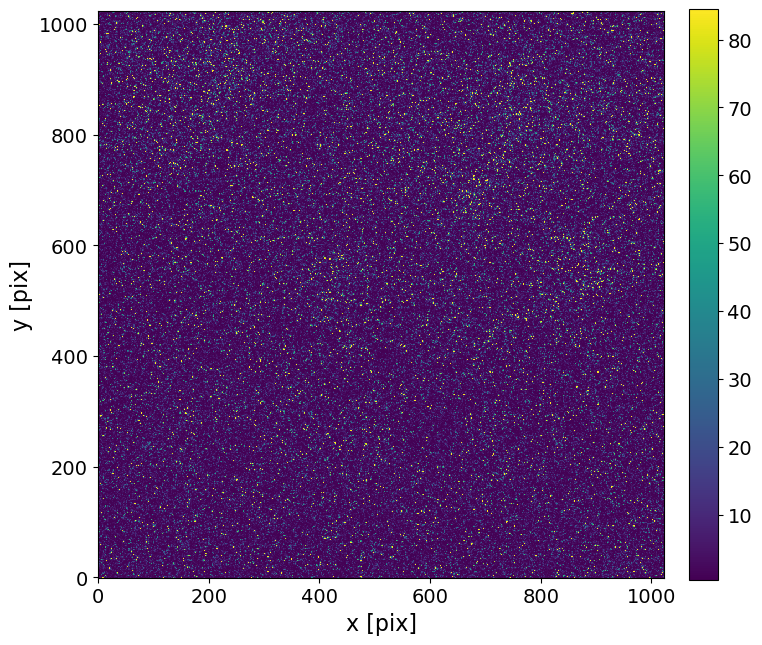

In [ ]:
cib_map = make_cib_mock(1, 4, mock_cat)

plot_map(cib_map)


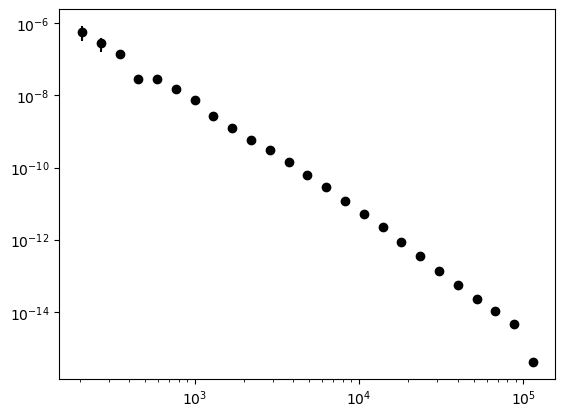

In [ ]:
lb, cl, clerr = get_power_spec(comb_kappa-np.mean(comb_kappa), nbins=26)

plt.figure()
plt.errorbar(lb, cl, yerr=clerr, fmt='o', color='k')
plt.xscale('log')
plt.yscale('log')
plt.show()

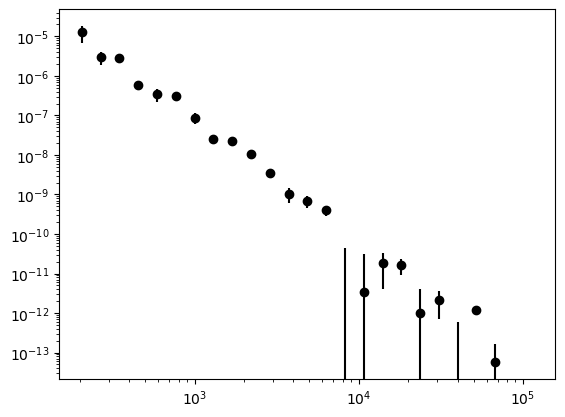

In [ ]:
lb, cl, clerr = get_power_spec(cib_map-np.mean(cib_map), map_b=comb_kappa-np.mean(comb_kappa), nbins=26)

plt.figure()
plt.errorbar(lb, cl, yerr=clerr, fmt='o', color='k')
plt.xscale('log')
plt.yscale('log')
plt.show()

min max of image in plot map are  0.13059647799899582 17.274521988592763


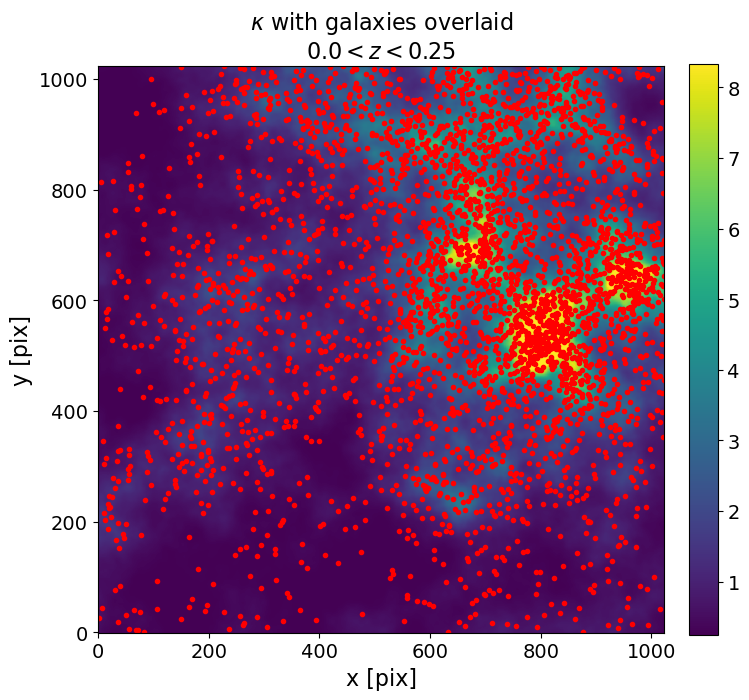

In [ ]:

# zrange_grf


zidx = 0
mask = (mock_cat[:,2] < zrange_grf[zidx+1])

xpos, ypos = mock_cat[:,0], mock_cat[:,1]

xpos_sel = xpos[mask]
ypos_sel = ypos[mask]

title = '$\\kappa$ with galaxies overlaid\n'+str(zrange_grf[zidx])+'$<z<$'+str(zrange_grf[zidx+1])

plot_map(all_kappa[zidx], title=title, scatter_xs=ypos_sel[::10], scatter_ys=xpos_sel[::10], scatter_color='r', scatter_marker='.')




In [ ]:
ng_bins = 8
zrange_grf = np.linspace(gcg.zmin, gcg.zmax, ng_bins+1) # ng_bins+1 since we take midpoints
midzs = 0.5*(zrange_grf[:-1]+zrange_grf[1:])


In [ ]:
import pyccl as ccl

import camb
# Define a cosmology with nonlinear P(k)
cosmo = ccl.CosmologyVanillaLCDM()

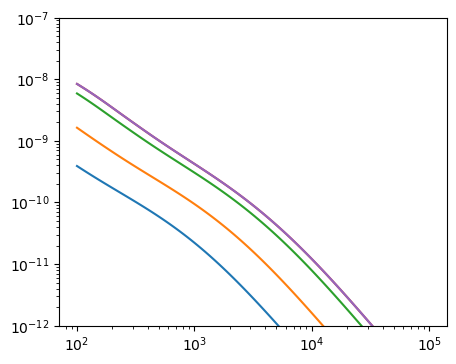

In [ ]:
z = np.linspace(0.01, 2.5, 500)

plt.figure(figsize=(5, 4))
ell = np.logspace(2, 5, 100)
for z_source in [0.5, 1.0, 2.0, 4.0, 1000.0]:
    
    
    chi = ccl.comoving_radial_distance(cosmo, 1/(1 + z))
    # Define a lensing kernel up to some source redshift z_s = 2
    z_kernel = z[z < z_source]
    n_of_z = np.ones_like(z_kernel)
    n_of_z /= np.trapz(n_of_z, z_kernel)  # normalized distribution

    # Use as a lensing tracer
    cib_lens_tracer = ccl.WeakLensingTracer(cosmo, dndz=(z_kernel, n_of_z))


    cl_kappa = ccl.angular_cl(cosmo, cib_lens_tracer, cib_lens_tracer, ell)  # κ auto

    plt.plot(ell, cl_kappa)
    
plt.xscale('log')
plt.yscale('log')
plt.ylim(1e-12, 1e-7)
plt.show()


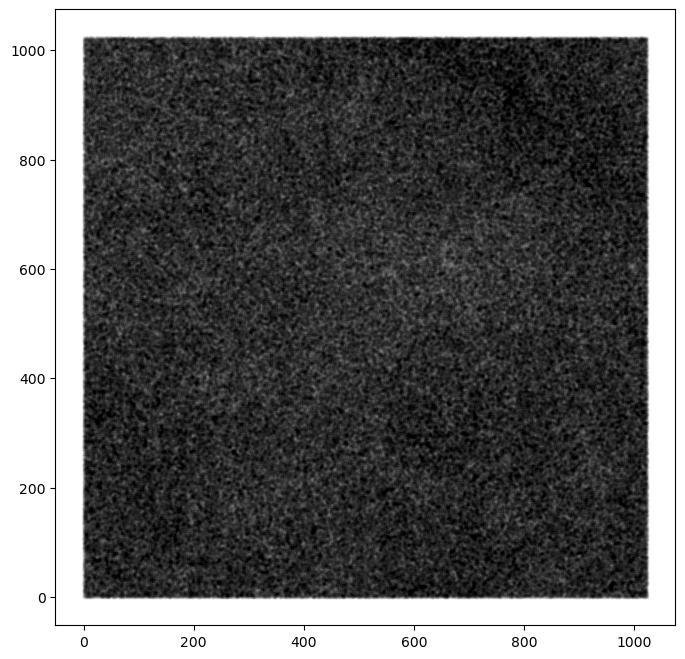

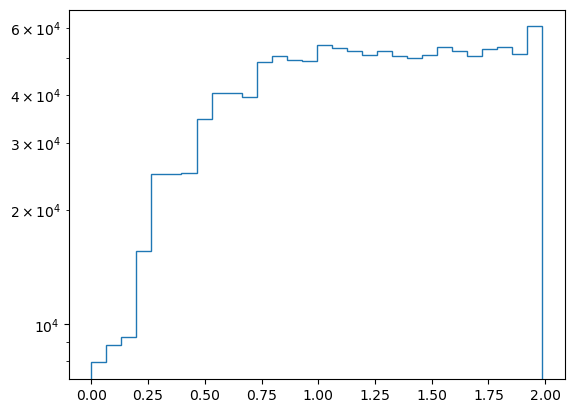

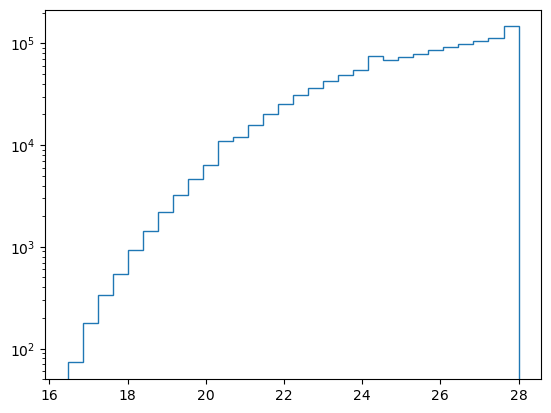

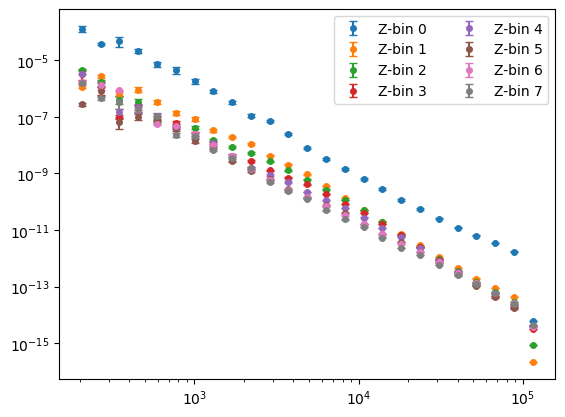

In [ ]:
from powerspec_utils import *


plt.figure(figsize=(8, 8))
plt.scatter(mock_cat[:,0], mock_cat[:,1], color='k', s=3, alpha=0.02)
plt.show()

plt.figure()
plt.hist(mock_cat[:,2], bins=30, histtype='step')
plt.yscale('log')
plt.show()

plt.figure()
plt.hist(mock_cat[:,3], bins=30, histtype='step')
plt.yscale('log')
plt.show()

plt.figure()

for x in range(all_kappa.shape[0]):
    
    lb, cl, clerr = get_power_spec(all_kappa[x]-np.mean(all_kappa[x]), nbins=26)
    
    plt.errorbar(lb, cl, yerr=clerr, fmt='o', color='C'+str(x), markersize=4, capsize=3, label='Z-bin '+str(x))
    
plt.legend(ncol=2)
plt.xscale('log')
plt.yscale('log')
plt.ylim(1e)
plt.show()

weights: [0.04094657 0.11311383 0.16338995 0.18749612 0.18535357 0.15870361
 0.10985766 0.0411387 ]
min max of image in plot map are  0.8186223626496442 1.388088561289109


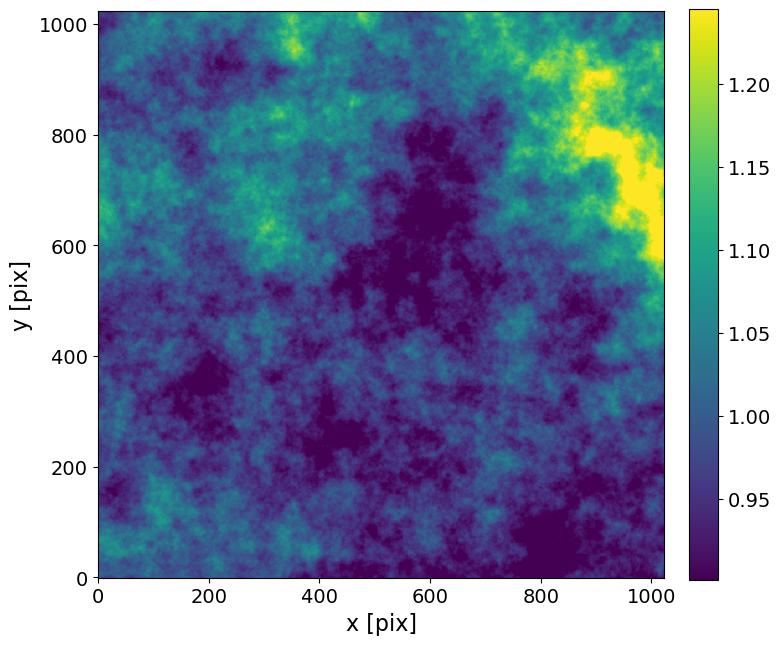

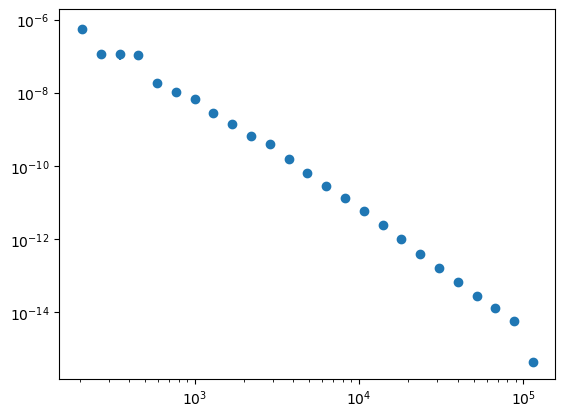

In [ ]:
int_kappa_map = combine_kappa_fields(all_kappa, midzs, z_s=2.0)

plot_map(int_kappa_map)

lb, clint, clerr_int = get_power_spec(int_kappa_map-np.mean(int_kappa_map), nbins=26)

plt.figure()
plt.errorbar(lb, clint, yerr=clerr_int, fmt='o')
plt.xscale('log')
plt.yscale('log')
plt.show()